### Important implementation details

You must write your own image transformation functions without relying on existing tools such as OpenCV or similar. **The allowed exceptions are:**
- routines to load image from file,
- conversion RGB images to grayscale and vice versa,
- conversion of image data type (e.g., int to float),
- threshold filtering,
- convolution.

Numpy arrays (`ndarray` type) with shape (height, width, 3) should be used to represent RGB images.

### General imports

In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import matplotlib.image as mpimg
import os

from skimage.io import imshow, imread
from skimage import color, data, restoration
from skimage.color import rgb2yuv, rgb2hsv, rgb2gray, yuv2rgb, hsv2rgb
from scipy.signal import convolve2d

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

from scipy.signal import convolve2d
from sklearn.preprocessing import MinMaxScaler
from skimage.exposure import rescale_intensity

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
os.chdir("/content/drive/MyDrive/Colab Notebooks/Image_Lab3")

### Processing of Dataset

In [54]:
def render_images(images, gray=False):
    """Render previously loaded images from container

    Args:
        cont: container with images
    """

    # TODO: Develop function to visualize images inside notebook.
    # Notes:
    #  - Make sure to have a descriptive caption for each image
    #  - Function does not return any value, only renders images

    num_images = len(images)
    if len(images) == 1:
      for image_name, image in images.items():
        plt.title(image_name)
        if gray:
          plt.imshow(image, cmap='gray')
        else:
          plt.imshow(image)
      return

    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for idx, (image_name, image) in enumerate(images.items()):
      if gray:
        axes[idx].imshow(image, cmap='gray')
      else:
        axes[idx].imshow(image)
      axes[idx].set_title(image_name)

    plt.tight_layout()
    plt.show()
    pass

In [33]:
def load_images(names, render=True):
    """Loads images from files and store them as container of numpy arrays

    Args:
        names: list of image files to load
        render: flag that defines if image should be rendered

    Returns:
        Container with loaded images
    """

    # TODO: Develop function to load images from files into container
    # Notes:
    #   - You can use any container for images that you want (e.g., list, dictionary, etc.)
    #   - Store images as numpy array (ndarray type) with shape (height, width, 3)

    images = {}
    for name in names:
      image = cv.imread(name)
      image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
      assert image is not None, f'file {name} could not be read, check with os.path.exists()'
      images[name] = image

    if render: render_images(images)
    return images

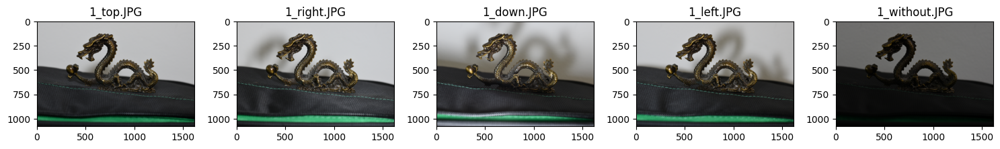

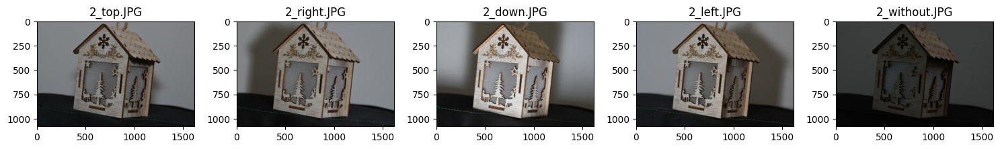

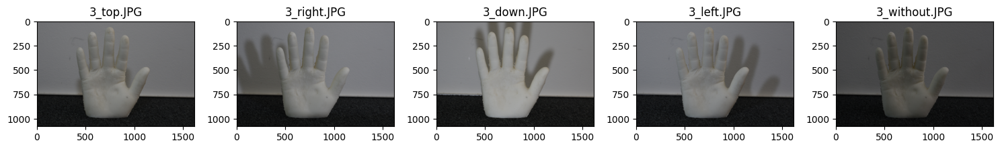

In [34]:
# TODO: Load images of each object into separate container and render them in notebook
# Total: 3x5 (15) images

images_1 = load_images([
    '1_top.JPG',
    '1_right.JPG',
    '1_down.JPG',
    '1_left.JPG',
    '1_without.JPG'
])

images_2 = load_images([
    '2_top.JPG',
    '2_right.JPG',
    '2_down.JPG',
    '2_left.JPG',
    '2_without.JPG'
])

images_3 = load_images([
    '3_top.JPG',
    '3_right.JPG',
    '3_down.JPG',
    '3_left.JPG',
    '3_without.JPG'
])

In [35]:
# TODO: Select single object to test functions of depth edge detecotr pipeline under development

In [36]:
def convert_to_grayscale(images):
    """Returns a container with grayscale images converted from RGB images

    Args:
        cont: container with RBG illuminated and ambient images

    Returns:
        Container with grayscale images
    """

    # TODO: Develop function to convert images to grayscale and return them as a new container

    converted = {}
    for image_name, img in images.items():
      converted[image_name] = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    return converted

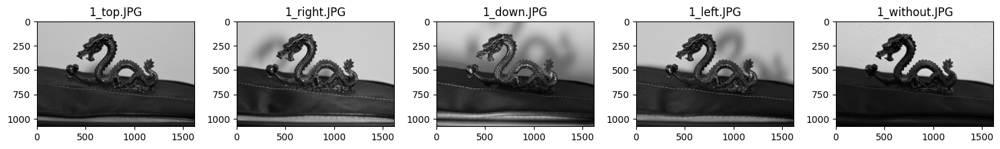

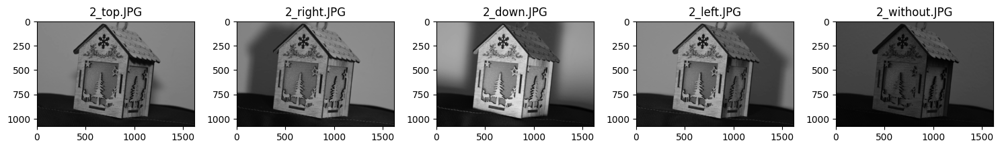

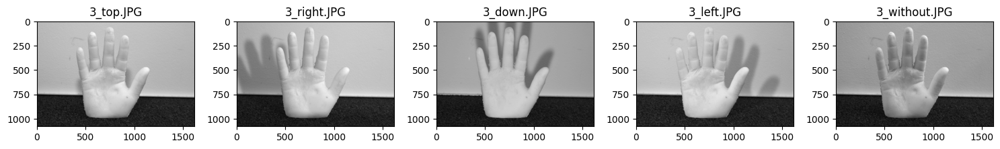

In [37]:
# TODO: Convert images to grayscale and render result in notebook
# Total: 1x5 images

gray_images_1 = convert_to_grayscale(images_1)
gray_images_2 = convert_to_grayscale(images_2)
gray_images_3 = convert_to_grayscale(images_3)

render_images(gray_images_1, gray=True)
render_images(gray_images_2, gray=True)
render_images(gray_images_3, gray=True)

In [38]:
def substract_ambient(cont):
    """Returns container with images of difference between an illuminated images and the ambient one

    Args:
        cont: container with grayscale illuminated and ambient images

    Returns:
        Container with images of calculated difference
    """
    ambient = ''
    for name, img in cont.items():
        if 'without' in name:
            ambient = img
            break

    sub_cont = {}
    for name, img in cont.items():
        if 'without' not in name:
            sub_cont[name] = cv.subtract(img, ambient)

    return sub_cont

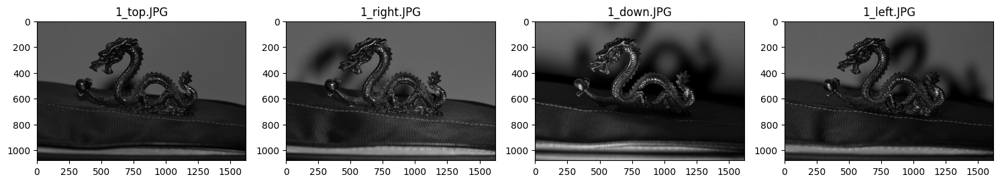

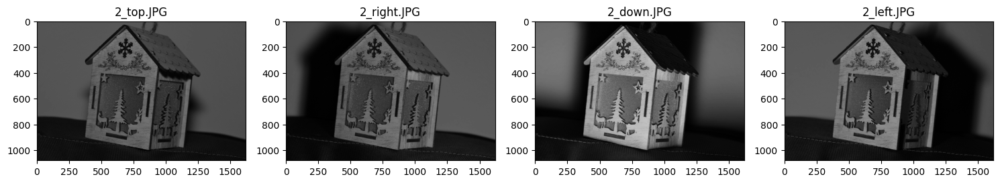

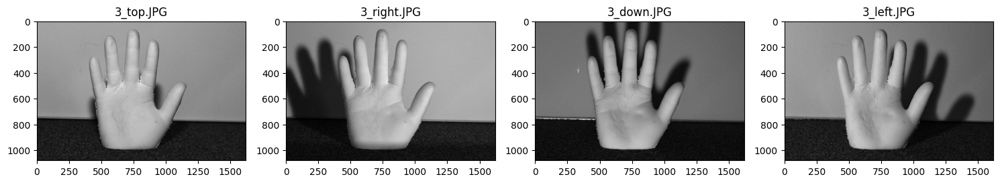

In [39]:
# TODO: Get images of difference between an illuminated images and the ambient one and render result in notebook
# Total: 1x4 images

sub_cont_1 = substract_ambient(gray_images_1)
sub_cont_2 = substract_ambient(gray_images_2)
sub_cont_3 = substract_ambient(gray_images_3)

render_images(sub_cont_1, gray=True)
render_images(sub_cont_2, gray=True)
render_images(sub_cont_3, gray=True)

In [40]:
def get_max_intensity_image(cont):
    """Returns image where each pixel has maximum intensity over corresponding pixels over all images of container

    Args:
        cont: container with images of difference between an illuminated images and the ambient one

    Returns:
        Image with maximum intensity of pixels
    """

    merged_image = np.amax(np.stack([img for img in cont.values()], axis=0), 0)
    return merged_image

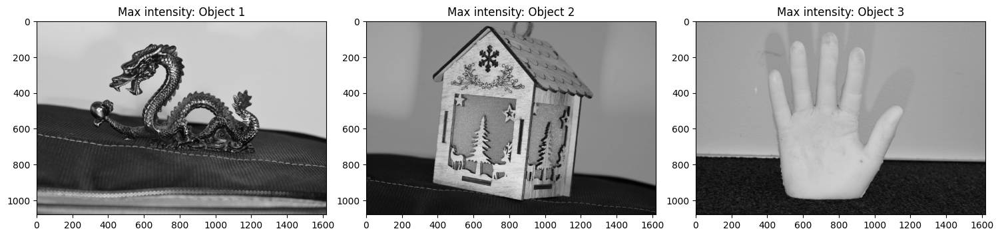

In [41]:
# TODO: Get maximum intensity image and render it in notebook
# Total: 1 image

max_intensity_image_1 = get_max_intensity_image(gray_images_1)
max_intensity_image_2 = get_max_intensity_image(gray_images_2)
max_intensity_image_3 = get_max_intensity_image(gray_images_3)


render_images({'Max intensity: Object 1' : max_intensity_image_1,
               'Max intensity: Object 2' : max_intensity_image_2,
               'Max intensity: Object 3' : max_intensity_image_3},
              gray=True)

In [42]:
def get_ratios(cont, mx):
    """Returns container with ratio between an images of difference and the maximum intensity image

    Args:
        cont: container with images of difference between an illuminated images and the ambient one
        mx: image with maximum intensity of pixel over all images of container

    Returns:
        Container with images of calculated ratios
    """

    # TODO: Develop function to calculate images with ratio and return them as a new container
    # Notes:
    #   - Pay attention to values of zero intensity in denominator and data types of images

    ratio_cont = {}

    for name, img in cont.items():
        ratio = (img.astype(float)/mx.astype(float))
        ratio[ratio == -np.inf] = 1
        ratio[ratio == np.inf] = 1
        assert ratio.max() <= 1 and ratio.min() >= 0

        ratio_cont[name] = ratio.copy()

    return ratio_cont

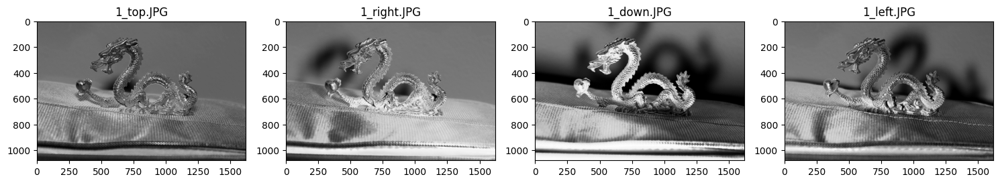

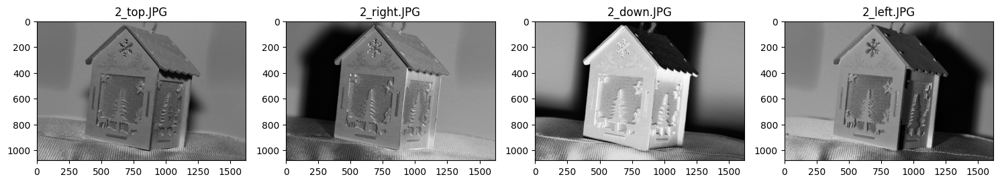

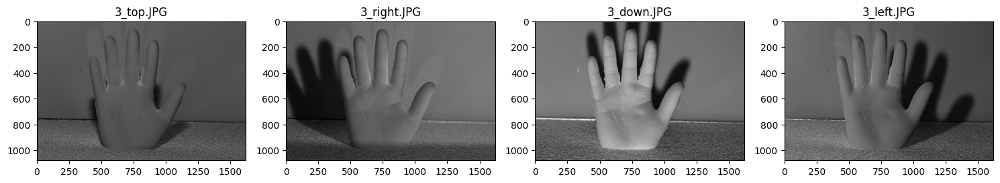

In [43]:
# TODO: Get images with ratio between an images of difference and the maximum intensity image and render result in notebook
# Total: 1x4 images

ratio_image_1 = get_ratios(sub_cont_1, max_intensity_image_1)
ratio_image_2 = get_ratios(sub_cont_2, max_intensity_image_2)
ratio_image_3 = get_ratios(sub_cont_3, max_intensity_image_3)


render_images(ratio_image_1, gray=True)
render_images(ratio_image_2, gray=True)
render_images(ratio_image_3, gray=True)

In [44]:
def get_gradient(cont, dirs):
    """Returns gradient of the images along corresponding directions usign 3x3 Scharr kernels to approximate the derivates

    Args:
        cont: container with images of calculated ratios
        dirs: container with directions that corresponds to container of images. Valid values are up, down, left, right.

    Returns:
        Container with images of calculated gradients
    """

    # TODO: Develop function to calculate gradient of the images along corresponding directions
    #       and return them as a new container
    # Notes:
    #   - It is acceptable to hardcode Scharr kernel due to specified kernel size
    #   - Ask TA for details about Scharr kernel, if you encounter some difficulties

    scaler = MinMaxScaler((0, 255))

    up_kernel = np.array([
        [ 3,  10,  3],
        [ 0,   0,  0],
        [-3, -10, -3]
    ]) / 32

    kernels = {
        'up'   :  up_kernel,
        'down' :  -1*up_kernel,
        'left' :  up_kernel.T,
        'right':  -1*(up_kernel.T)
    }

    grad = {}
    for drc in dirs:
        grad[drc] = {}
        for name, img in cont.items():
            grad_img = convolve2d(img.astype(float), kernels[drc].astype(float), mode='same', boundary='symm')
            grad_img = rescale_intensity(abs(grad_img))
            grad[drc][name] = grad_img.copy()
    return grad

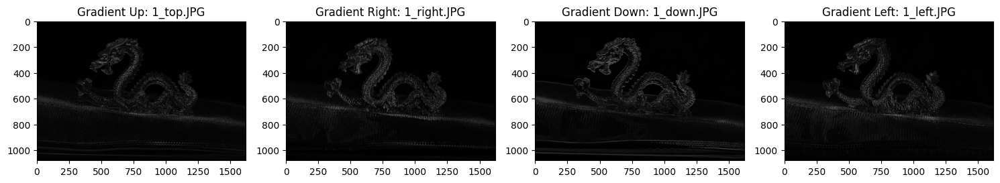

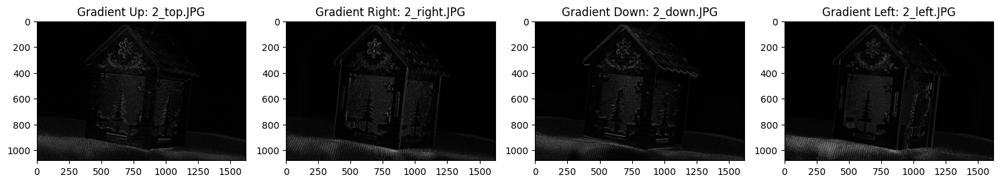

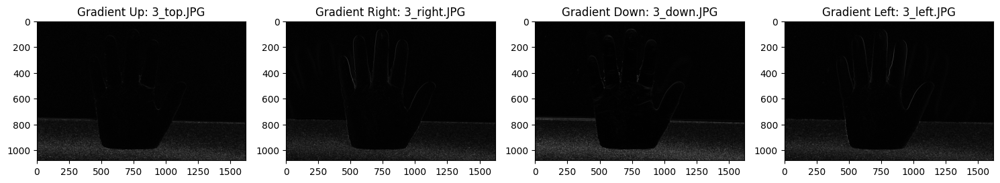

In [45]:
# TODO: Get images of gradient along corresponding directions and render result in notebook
# Total: 1x4 images

gradient_1 = get_gradient(ratio_image_1, ['up', 'right', 'down', 'left'])
gradient_2 = get_gradient(ratio_image_2, ['up', 'right', 'down', 'left'])
gradient_3 = get_gradient(ratio_image_3, ['up', 'right', 'down', 'left'])


for i, gradient in zip(range(1, 3+1), [gradient_1, gradient_2, gradient_3]):

  render_images({f"Gradient Up: {i}_top.JPG"      : gradient['up'][f'{i}_top.JPG'],
                 f"Gradient Right: {i}_right.JPG" : gradient['right'][f'{i}_right.JPG'],
                 f"Gradient Down: {i}_down.JPG"   : gradient['down'][f'{i}_down.JPG'],
                 f"Gradient Left: {i}_left.JPG"   : gradient['left'][f'{i}_left.JPG']
                }, gray=True)


In [46]:
from cycler import L
def generate_edge_map(grads, obj, bounds):
    """Returns image of edge map of corresponding illuminated images

    Args:
        cont: container with images of gradients
        sl: slice to work with a region of the image (optional)

    Returns:
        Image with calculated edge map
    """

    # TODO: Develop function to generate edge map of corresponding illuminated images
    # Notes:
    #   - Function should result single image for entire dataset

    summ = grads['left'][obj + '_left.JPG'] + grads['right'][obj + '_right.JPG'] + grads['up'][obj + '_top.JPG'] + grads['down'][obj + '_down.JPG']
    summ[np.where(summ < bounds['lower_bound'])] = 0
    summ[np.where(summ > bounds['upper_bound'])] = 0

    return summ

In [58]:
def overlay_edge_map(image, edges, color=None):
    """Returns image with overlay of edge map rendered using selected color over ambient image

    Args:
        cont: container with RGB illuminated and ambient images
        edge_map: image of the detected edges
        color: color of overlay. Valid values are white, black, red, green, blue

    Returns:
        Image with edge map overlay
    """

    # TODO: Develop function to generate image with overlay of the edge map

    colors = {
        'red'   : [255, 0, 0],
        'green' : [0, 255, 0],
        'blue'  : [0, 0, 255],
        'black' : [0, 0, 0],
        'white' : [255, 255, 255]
      }

    image = image.copy()

    if color is None:
      arr_color = np.random.randint(0, 255, (3,)).tolist()
    else:
      arr_color = colors[color]

    tmp = np.zeros_like(image).astype('float')
    tmp[edges != 0] = arr_color
    tmp[:, :, 0] *= np.exp(1 + edges / edges.max())

    t = 0.1
    image[edges > t * edges.max()] = tmp[edges > t * edges.max()]

    return image

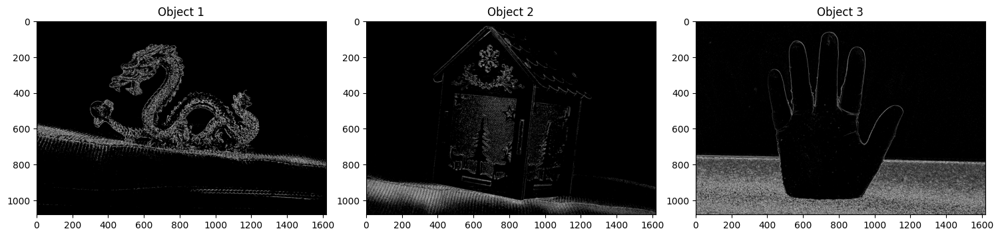

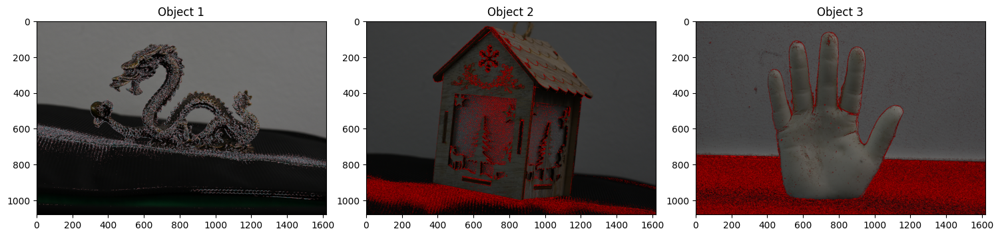

In [61]:
# TODO: Get resulting edge map and overlay image. Render overlay image in notebook
# Total: 1 image

edge_1 = generate_edge_map(gradient_1, '1', {'lower_bound' : 0.4, 'upper_bound' : 0.8})
edge_2 = generate_edge_map(gradient_2, '2', {'lower_bound' : 0.4, 'upper_bound' : 1.8})
edge_3 = generate_edge_map(gradient_3, '3', {'lower_bound' : 0.1, 'upper_bound' : 0.7})


render_images({'Object 1' : edge_1,
               'Object 2' : edge_2,
               'Object 3' : edge_3}, gray=True)


overlay_1 = overlay_edge_map(images_1['1_without.JPG'], edge_1)
overlay_2 = overlay_edge_map(images_2['2_without.JPG'], edge_2, color='red')
overlay_3 = overlay_edge_map(images_3['3_without.JPG'], edge_3, color='red')

render_images({'Object 1' : overlay_1,
               'Object 2' : overlay_2,
               'Object 3' : overlay_3}, gray=True)

In [79]:
def depth_edge_detector(names, color, boundaries, obj):
    """Calulates edge map using developed pipeline and renders image with overlay
    of edge map rendered using selected color over ambient image

    Args:
        folder: path to folder with captured images
        color: color of overlay. Valid values are white, black, red, green, blue
    """

    # TODO: Collect a depth edge detector pipeline by wrapping up developed functions into a single one
    # Notes:
    #   - Function should render all intermediate results of calculations (as separate functions did)

    images = load_images(names)

    gray_images = convert_to_grayscale(images)
    render_images(gray_images, gray=True)

    sub_cont = substract_ambient(gray_images)
    render_images(sub_cont, gray=True)

    max_intensity_image = get_max_intensity_image(gray_images)
    render_images({'Max intensity' : max_intensity_image}, gray=True)

    ratio_image = get_ratios(sub_cont, max_intensity_image)
    render_images(ratio_image, gray=True)

    gradient = get_gradient(ratio_image, ['up', 'right', 'down', 'left'])

    edge = generate_edge_map(gradient, obj, boundaries)
    render_images({'Object ' + obj : edge}, gray=True)

    overlay = overlay_edge_map(images[obj + '_without.JPG'], edge, color=color)
    render_images({'Object ' + obj : overlay}, gray=True)

    pass

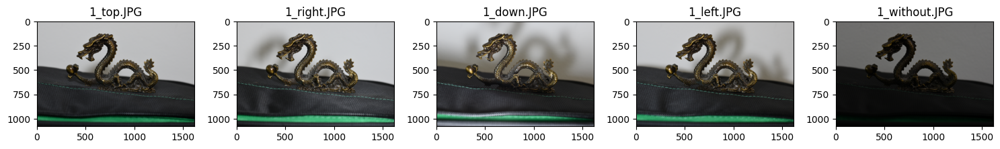

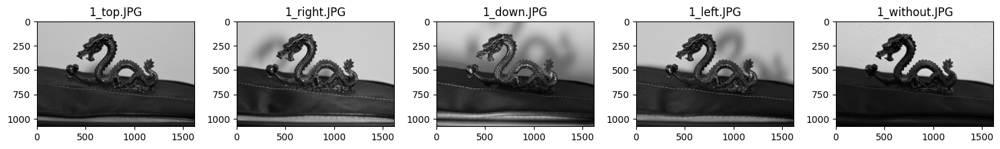

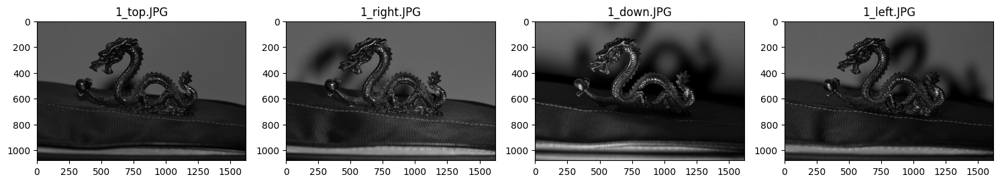

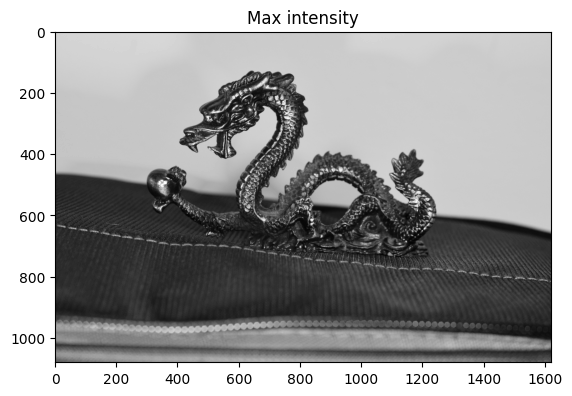

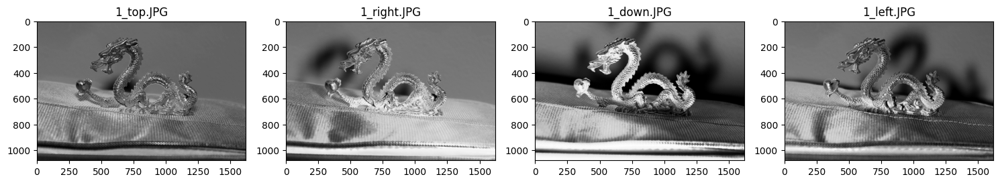

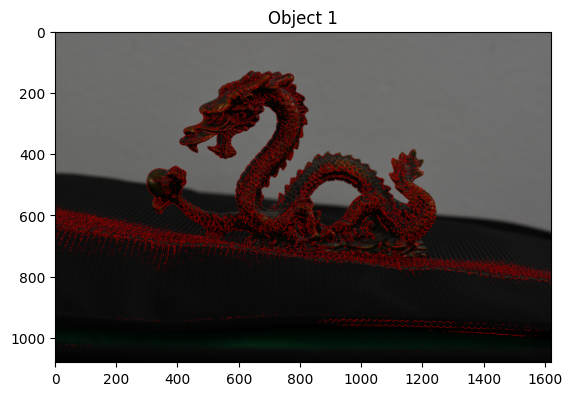

In [80]:
# TODO: For dataset #1 use developed depth edge detecotr pipeline to show resulting overlay and all intermediate results
# Total: 1x5, 1x5, 1x4, 1, 1x4, 1x4, 1 images

names = [
    '1_top.JPG',
    '1_right.JPG',
    '1_down.JPG',
    '1_left.JPG',
    '1_without.JPG'
]

depth_edge_detector(names, 'red', {'lower_bound' : 0.4, 'upper_bound' : 0.8}, '1')

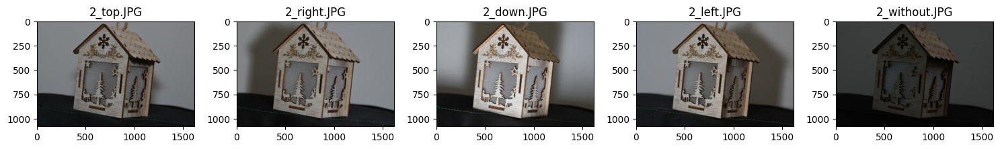

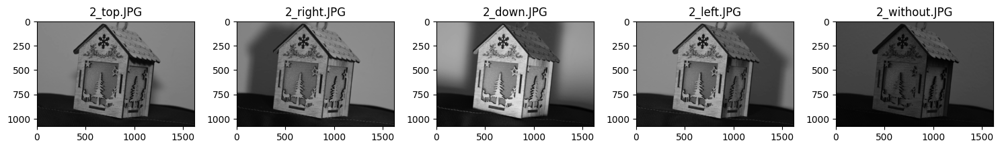

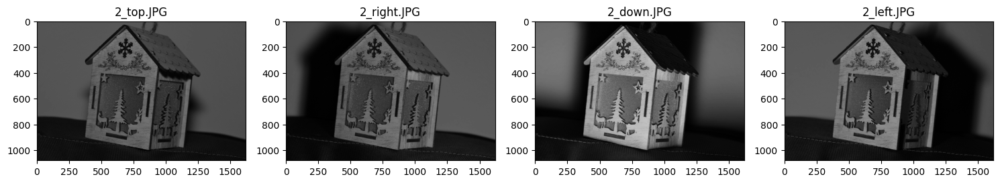

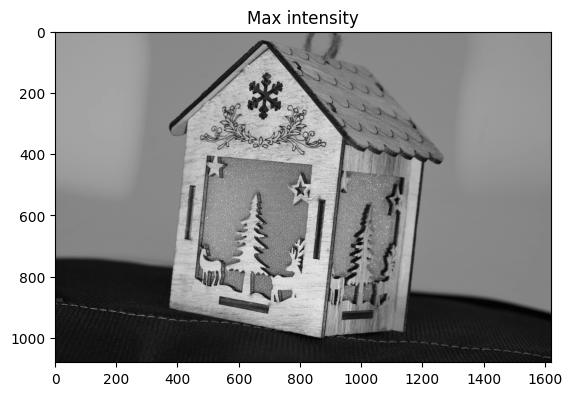

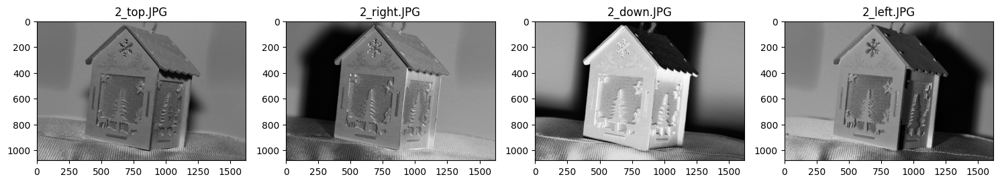

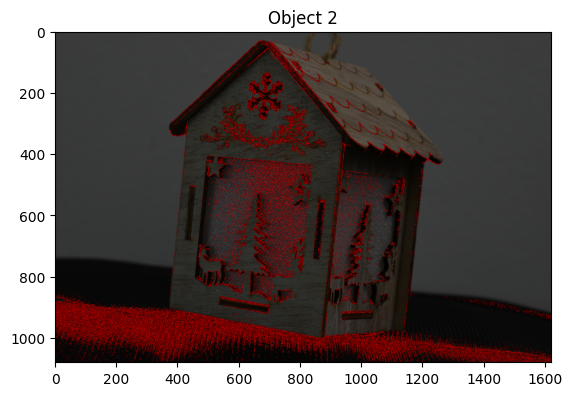

In [81]:
# TODO: For dataset #2 use developed depth edge detecotr pipeline to show resulting overlay and all intermediate results
# Total: 1x5, 1x5, 1x4, 1, 1x4, 1x4, 1 images

names = [
    '2_top.JPG',
    '2_right.JPG',
    '2_down.JPG',
    '2_left.JPG',
    '2_without.JPG'
]

depth_edge_detector(names, 'red', {'lower_bound' : 0.4, 'upper_bound' : 1.8}, '2')

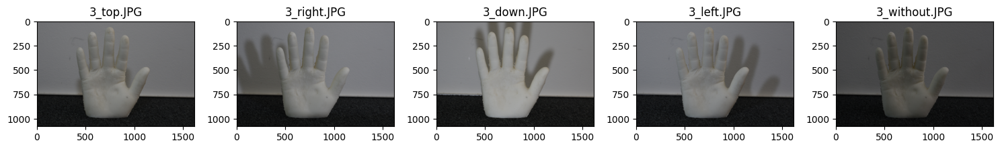

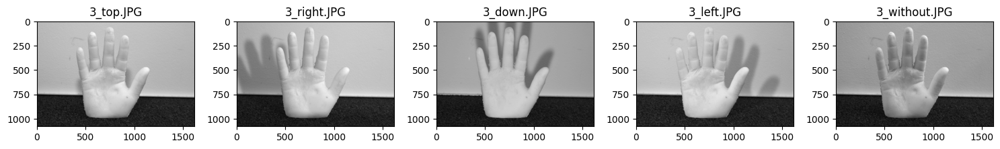

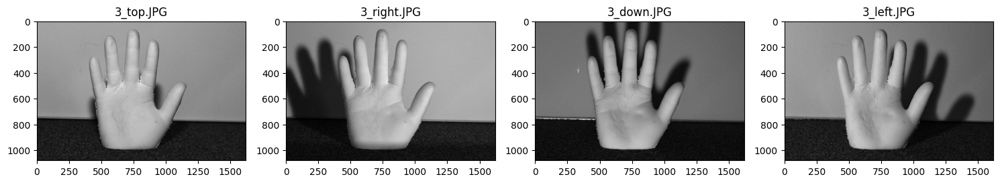

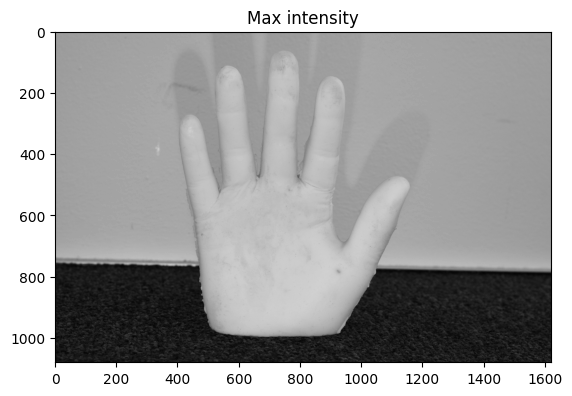

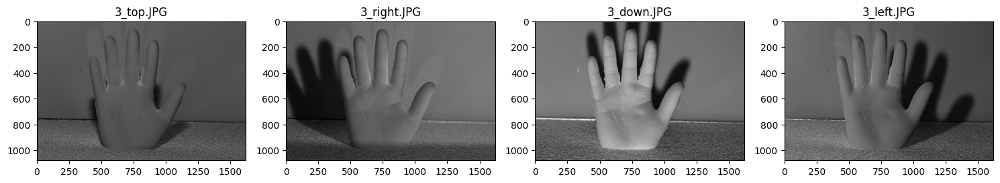

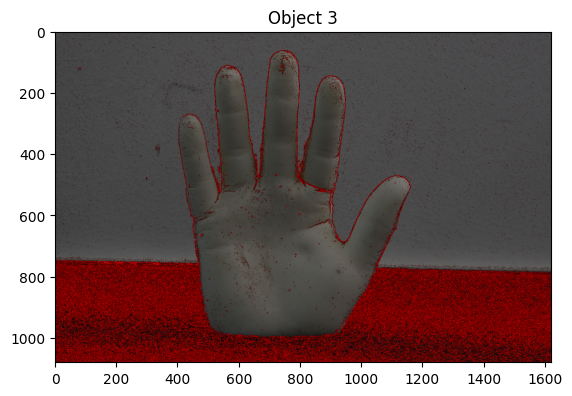

In [82]:
# TODO: For dataset #3 use developed depth edge detecotr pipeline to show resulting overlay and all intermediate results
# Total: 1x5, 1x5, 1x4, 1, 1x4, 1x4, 1 images

names = [
    '3_top.JPG',
    '3_right.JPG',
    '3_down.JPG',
    '3_left.JPG',
    '3_without.JPG'
]

depth_edge_detector(names, 'red', {'lower_bound' : 0.1, 'upper_bound' : 0.7}, '3')

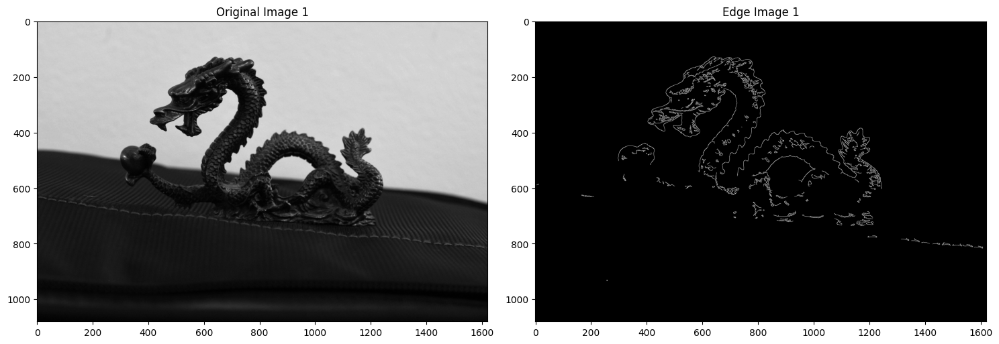

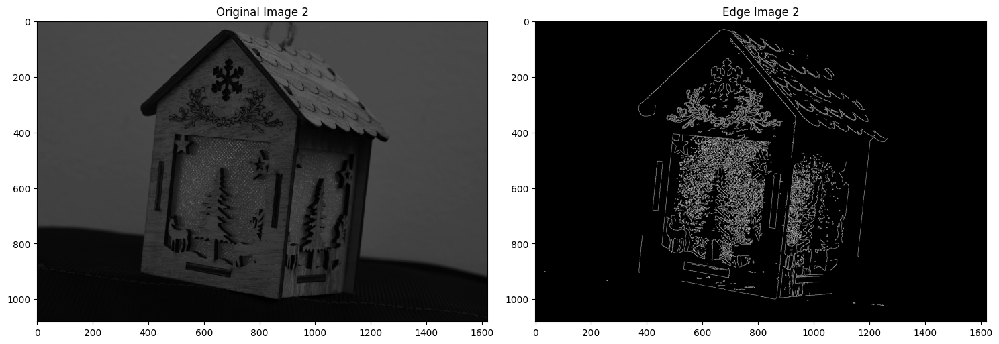

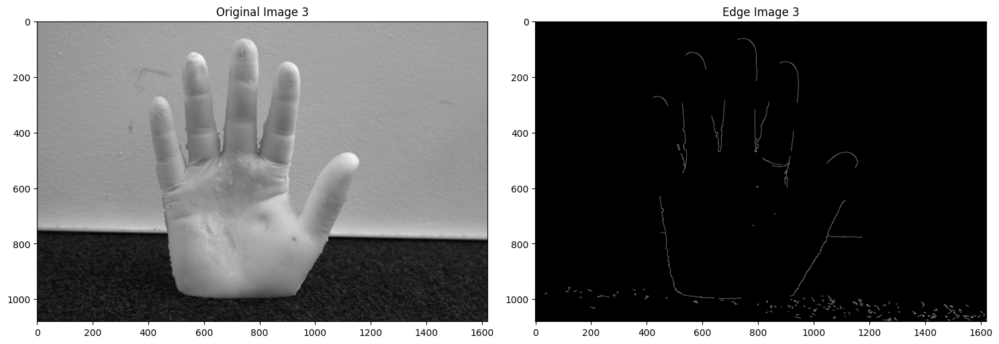

In [53]:
# TODO: Apply Canny edge detector for ambient image of single object (you may use one that was selected earlier)

t_lower = [45, 45, 45]   # Lower Threshold
t_upper = [120, 100, 100]  # Upper threshold

gray_images = [gray_images_1, gray_images_2, gray_images_3]

for i in range(1, 4):
    edge = cv.Canny(gray_images[i-1][f'{i}_without.JPG'], t_lower[i-1], t_upper[i-1])

    render_images({
        f'Original Image {i}' : gray_images[i-1][f'{i}_without.JPG'],
        f'Edge Image {i}' : edge
    }, gray=True)

*`TODO:`* Describe what are the differences between results of developed depth edge detector and Canny edge detector.
Explain what are the potential reasons of observed differences.

Developed depth edge detector displays more white linear outlines (edges) of the image than Canny edge detector.

Canny edge detector does not take into account information about the location of the flashes, since it processes information from only one image. While the Developed depth edge detector receives information from a larger number of images of different illumination and, due to this, can determine more image edges.